In [3]:
import torch
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import cv2
import numpy as np
import time
# %pip install pyttsx3
# !apt-get update && apt-get install -y espeak espeak-ng
import pyttsx3  # For text-to-speech
import geopy.distance
import requests

class BlindAssistantNavigator:
    def __init__(self, model_name="tobiasc/segformer-b0-finetuned-segments-sidewalk"):
        # Initialize the model
        self.processor = SegformerImageProcessor.from_pretrained(model_name)
        self.model = SegformerForSemanticSegmentation.from_pretrained(model_name)
        self.model.eval()

        # Text-to-speech engine
        self.tts_engine = pyttsx3.init()
        self.tts_engine.setProperty('rate', 150)  # Speaking rate

        # Class IDs for relevant objects (modify based on model's classes)
        self.sidewalk_id = 2  # Class ID for sidewalk
        self.road_id = 1      # Class ID for road
        self.crosswalk_id = 3 # Class ID for crosswalk

        # Navigation state
        self.destination = None
        self.on_sidewalk = False
        self.last_instruction_time = 0
        self.instruction_cooldown = 5  # Seconds between instructions

        # Initialize camera
        self.camera = cv2.VideoCapture(0)

    def speak(self, message):
        """Speak a message to the user"""
        print(f"Assistant: {message}")
        self.tts_engine.say(message)
        self.tts_engine.runAndWait()

    def set_destination(self, destination_name):
        """Set the destination (e.g., 'pharmacy')"""
        # In a real app, this would use a geocoding API
        self.destination = destination_name
        self.speak(f"Setting destination to the nearest {destination_name}.")

    def get_direction_to_destination(self):
        """Get direction to destination using GPS and mapping API"""
        # Simplified - in real implementation would use GPS and mapping API
        # Returns bearing in degrees (0=North, 90=East, etc.)
        return 45  # Example: destination is northeast

    def get_current_heading(self):
        """Get current heading from device compass"""
        # Simplified - in real implementation would use device compass
        return 90  # Example: facing east

    def analyze_frame(self, frame):
        """Analyze a camera frame with the segmentation model"""
        # Prepare image for model
        inputs = self.processor(images=frame, return_tensors="pt")

        # Run inference
        with torch.no_grad():
            outputs = self.model(**inputs)

        # Get prediction
        logits = outputs.logits
        upsampled_logits = torch.nn.functional.interpolate(
            logits,
            size=(frame.shape[0], frame.shape[1]),
            mode="bilinear",
            align_corners=False
        )

        # Get segmentation mask
        seg_map = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

        return seg_map

    def determine_navigation_instruction(self, segmentation_map):
        """Determine navigation instruction based on sidewalk detection"""
        height, width = segmentation_map.shape

        # Check if user is on sidewalk (center-bottom of image)
        bottom_center_region = segmentation_map[int(height*0.7):, int(width*0.3):int(width*0.7)]
        on_sidewalk = np.sum(bottom_center_region == self.sidewalk_id) > (bottom_center_region.size * 0.4)

        # Find sidewalk locations in different parts of image
        left_region = segmentation_map[:, :int(width*0.3)]
        right_region = segmentation_map[:, int(width*0.7):]

        sidewalk_left = np.sum(left_region == self.sidewalk_id) > (left_region.size * 0.2)
        sidewalk_right = np.sum(right_region == self.sidewalk_id) > (right_region.size * 0.2)

        # Determine instruction
        if not on_sidewalk:
            if sidewalk_left:
                return "Not on sidewalk. Turn left to find sidewalk."
            elif sidewalk_right:
                return "Not on sidewalk. Turn right to find sidewalk."
            else:
                return "No sidewalk detected. Please be cautious and scan around."
        else:
            # We're on a sidewalk - now get directional guidance
            current_heading = self.get_current_heading()
            target_heading = self.get_direction_to_destination()

            # Calculate turn needed (simplified)
            heading_diff = (target_heading - current_heading) % 360

            if heading_diff < 20 or heading_diff > 340:
                return "Continue straight on the sidewalk."
            elif 20 <= heading_diff <= 160:
                return "Turn right at the next opportunity to head toward the pharmacy."
            else:
                return "Turn left at the next opportunity to head toward the pharmacy."

    def run(self):
        """Main loop for the assistant"""
        self.speak("Blind navigation assistant started. I'll help you navigate to your destination safely.")
        self.set_destination("pharmacy")

        try:
            while True:
                ret, frame = self.camera.read()
                if not ret:
                    self.speak("Camera error. Please restart the application.")
                    break

                # Resize for faster processing
                frame = cv2.resize(frame, (640, 480))

                # Analyze frame
                segmentation_map = self.analyze_frame(frame)

                # Get navigation instruction
                instruction = self.determine_navigation_instruction(segmentation_map)

                # Speak instruction if enough time has passed
                current_time = time.time()
                if current_time - self.last_instruction_time > self.instruction_cooldown:
                    self.speak(instruction)
                    self.last_instruction_time = current_time

                # Check for stop command (in a real app, this would be voice activated)
                key = cv2.waitKey(1) & 0xFF
                if key == ord('q'):
                    break

        finally:
            self.camera.release()
            cv2.destroyAllWindows()
            self.speak("Navigation assistant stopped.")

# Example usage
if __name__ == "__main__":
    navigator = BlindAssistantNavigator()
    navigator.run()

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,369 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:9 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,723 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:11 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [3,774 kB]
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:13 http://archive.ubuntu.com/u

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/271 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/utils/deprecation.py:165: UserWarning: The following named arguments are not valid for `SegformerImageProcessor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


config.json:   0%|          | 0.00/3.00k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/14.9M [00:00<?, ?B/s]

Assistant: Blind navigation assistant started. I'll help you navigate to your destination safely.
Assistant: Setting destination to the nearest pharmacy.
Assistant: Camera error. Please restart the application.
Assistant: Navigation assistant stopped.


Loading model: tobiasc/segformer-b0-finetuned-segments-sidewalk
Processing: sidewalk-imgs/90c0510d-8d05-45cf-a8f6-c0ead20cf31b.jpg


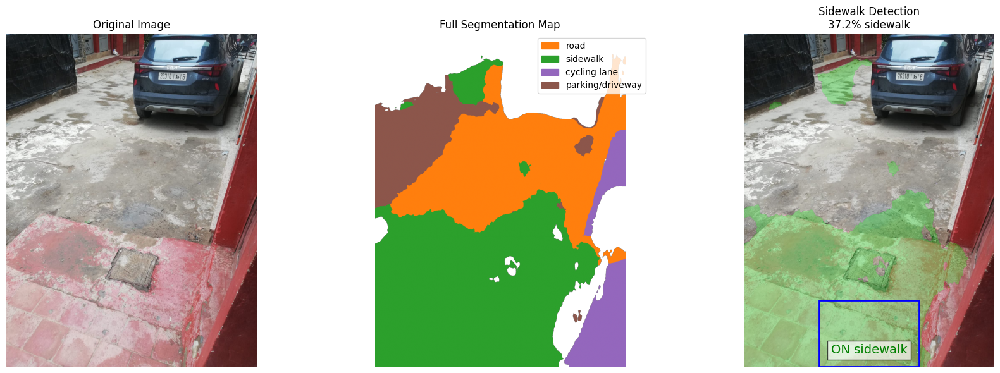

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw6.jpg


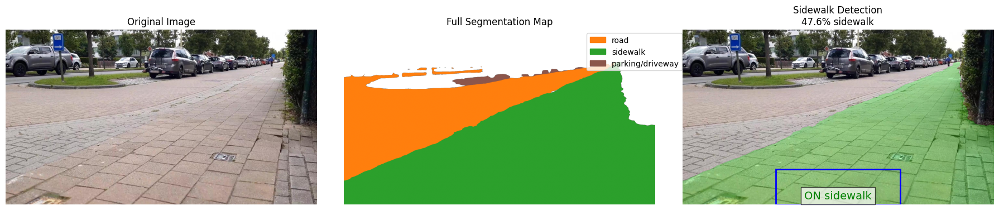

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/WhatsApp Image 2025-03-08 at 09.12.58.jpg


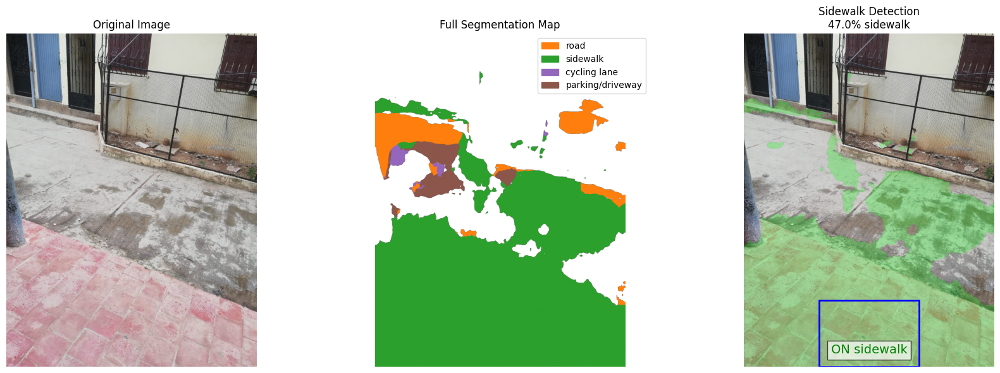

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw.jpg


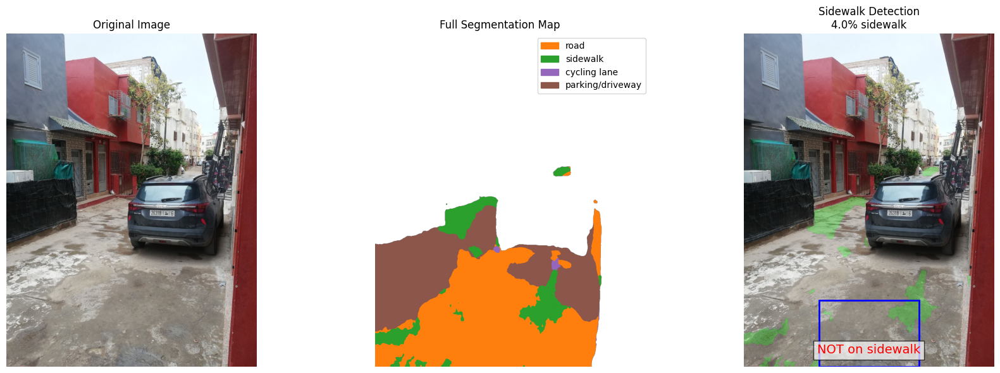

Navigation instruction: No sidewalk detected nearby. Scan the area by turning slowly.
Processing: sidewalk-imgs/ce9b2771-c988-45d0-983b-8ff7837f5faa.jpg


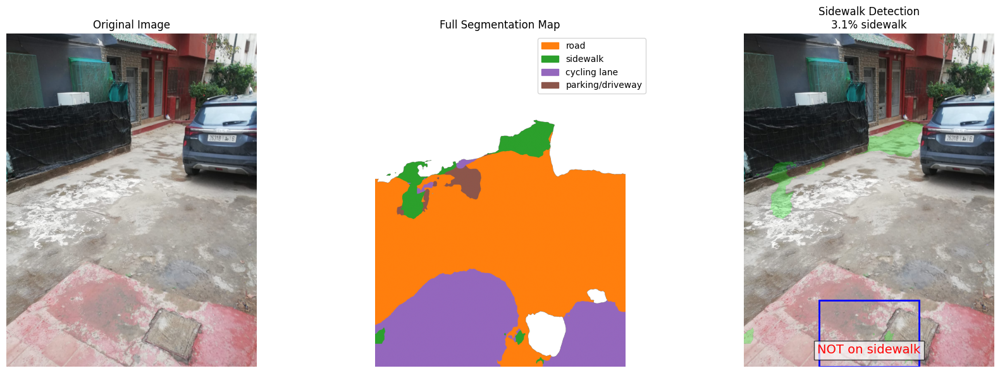

Navigation instruction: No sidewalk detected nearby. Scan the area by turning slowly.
Processing: sidewalk-imgs/sw5.jpg


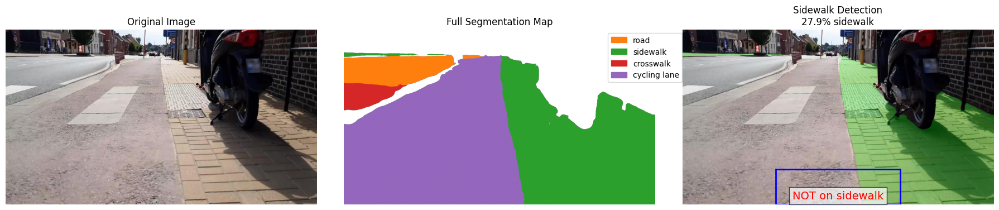

Navigation instruction: Turn RIGHT to reach the sidewalk.
Processing: sidewalk-imgs/81fcc0a1-d530-4c95-8f3c-496cde9d3eac.jpg


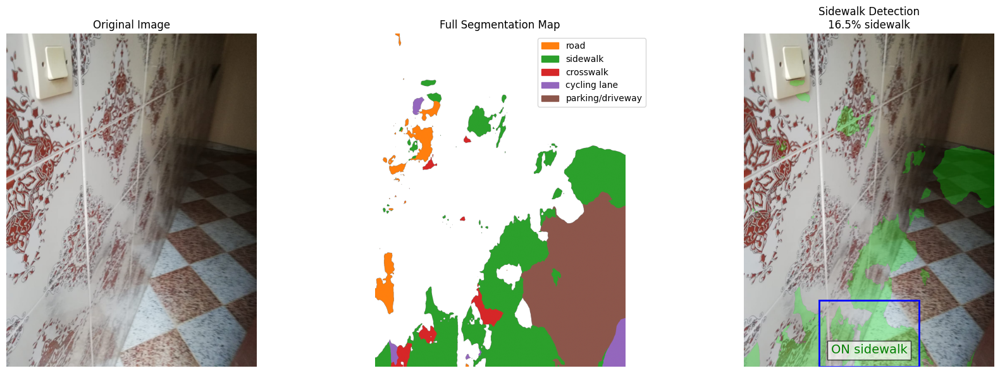

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw1.jpg


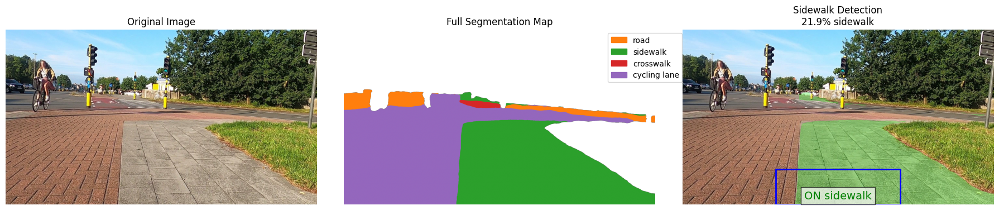

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw10.jpg


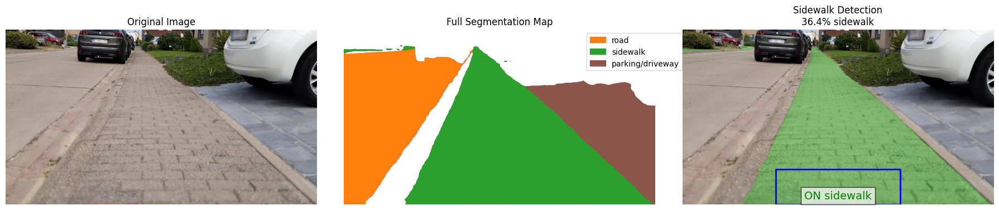

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/Raw_0.jpg


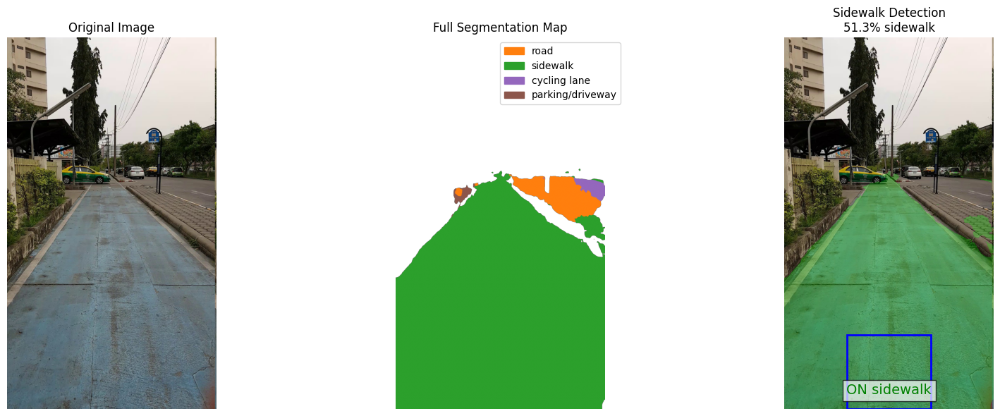

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw9.jpg


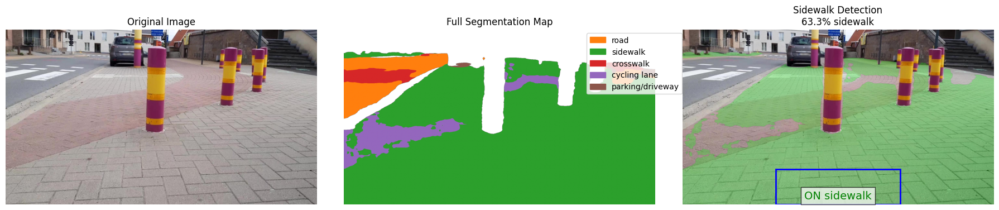

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw4.jpg


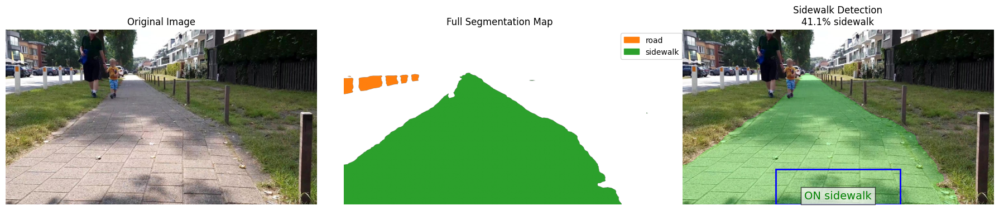

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw8.jpg


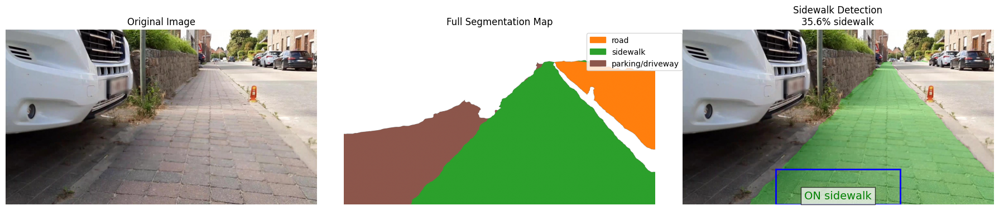

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/cab7742c-3269-4da7-8371-675380969ab1.jpg


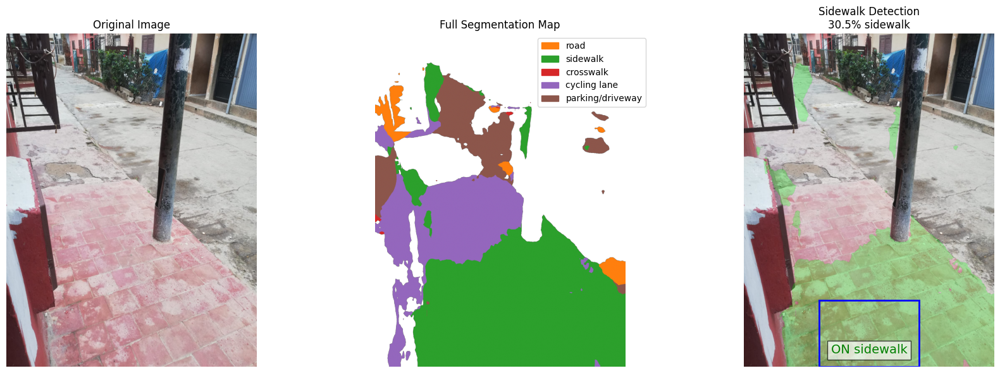

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw2.jpg


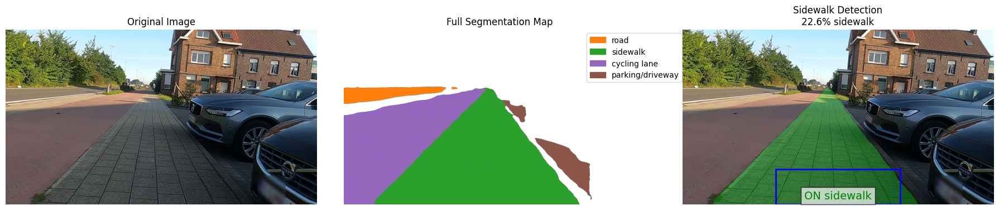

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/sw3.jpg


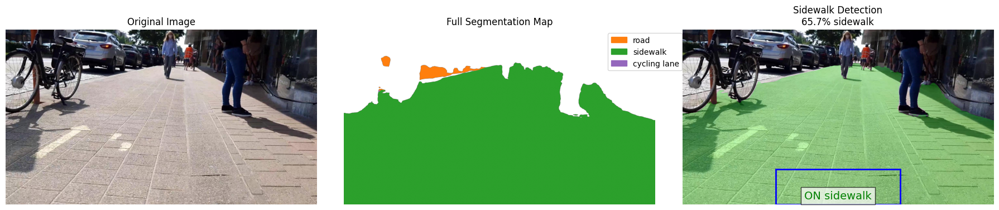

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/69c27cc3-4314-4185-babc-337cc4cced9f.jpg


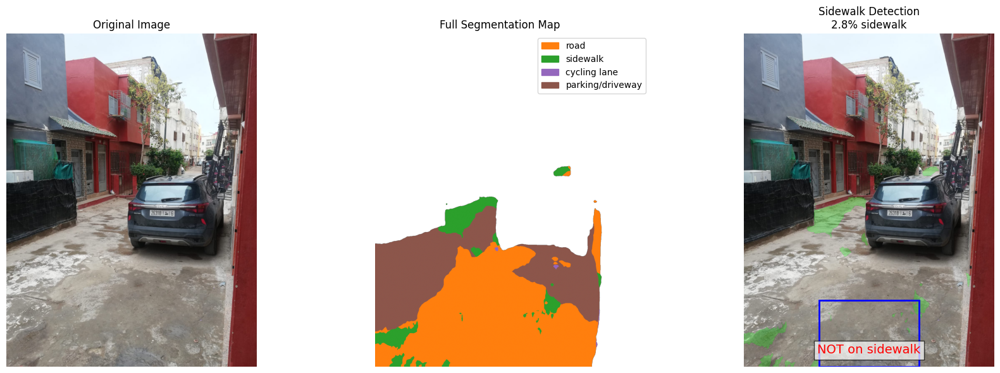

Navigation instruction: No sidewalk detected nearby. Scan the area by turning slowly.
Processing: sidewalk-imgs/WhatsApp Image 2025-03-08 at 09.12.57.jpg


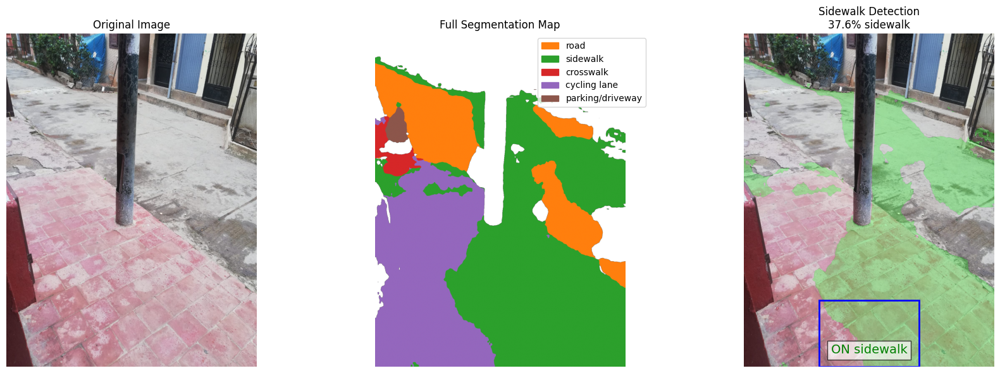

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/Raw_119.jpg


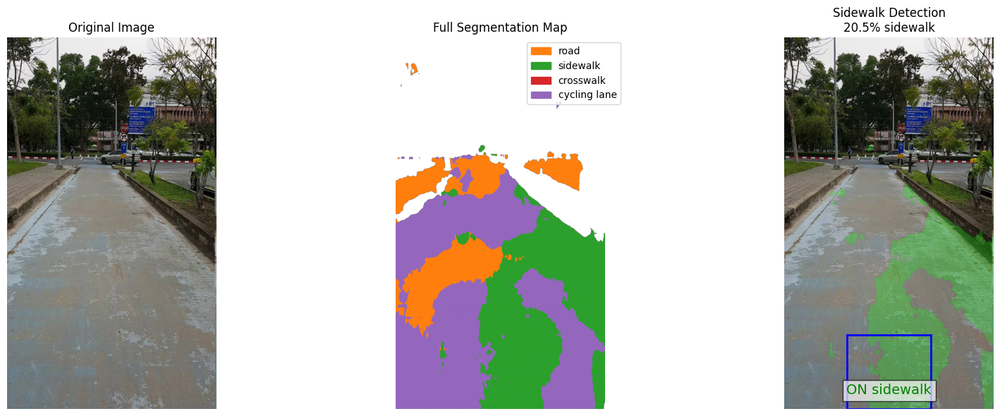

Navigation instruction: Continue forward on the sidewalk.
Processing: sidewalk-imgs/Raw_107.jpg


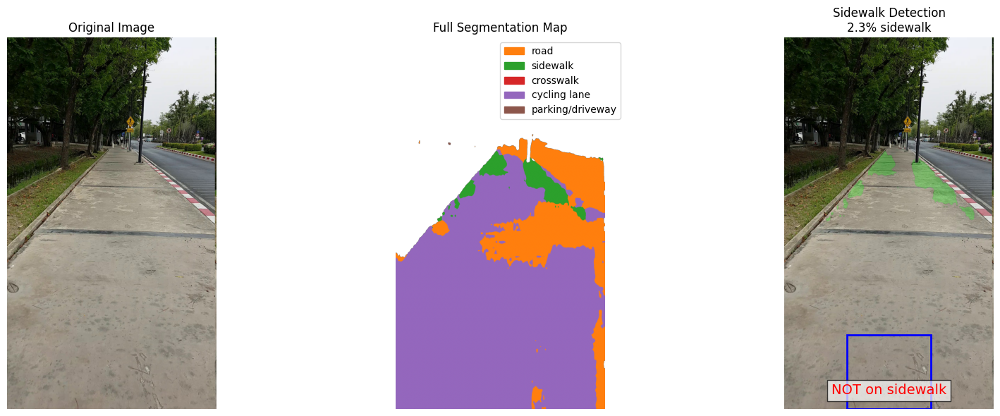

Navigation instruction: No sidewalk detected nearby. Scan the area by turning slowly.
Processing: sidewalk-imgs/sw7.jpg


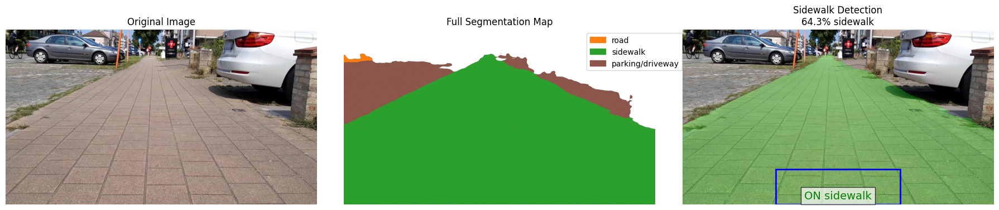

Navigation instruction: Continue forward on the sidewalk.


In [4]:
import torch
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
from glob import glob

def test_segformer_on_images(model_name, image_paths):
    """
    Test the SegFormer model on multiple sample images and visualize results

    Args:
        model_name: Hugging Face model identifier or local path
        image_paths: List of paths to test images
    """
    # Load model and processor
    print(f"Loading model: {model_name}")
    processor = SegformerImageProcessor.from_pretrained(model_name)
    model = SegformerForSemanticSegmentation.from_pretrained(model_name)
    model.eval()  # Set to evaluation mode

    # Define class names and colors (adjust based on the actual model classes)
    class_names = {
        0: "unlabeled",
        1: "road",
        2: "sidewalk",
        3: "crosswalk",
        4: "cycling lane",
        5: "parking/driveway",
        # Add more classes as needed
    }

    # Create a colormap (distinct colors for each class)
    # Using tab10 colormap for distinct colors
    cmap = plt.cm.tab10
    colors = [cmap(i % 10) for i in range(30)]  # Supports up to 30 classes

    # Process each image
    for img_path in image_paths:
        print(f"Processing: {img_path}")

        # Load image
        image = Image.open(img_path)

        # Prepare image for the model
        inputs = processor(images=image, return_tensors="pt")

        # Run inference
        with torch.no_grad():
            outputs = model(**inputs)

        # Get logits and resize to original image size
        logits = outputs.logits
        upsampled_logits = torch.nn.functional.interpolate(
            logits,
            size=image.size[::-1],  # (height, width)
            mode="bilinear",
            align_corners=False
        )

        # Get prediction masks
        seg_map = upsampled_logits.argmax(dim=1)[0].cpu().numpy()

        # Create a mask specifically for sidewalks (class_id 2)
        sidewalk_mask = (seg_map == 2)

        # Calculate percentage of sidewalk in the image
        sidewalk_percentage = np.sum(sidewalk_mask) / sidewalk_mask.size * 100

        # Determine if person is likely on sidewalk (simplified: check bottom center of image)
        h, w = seg_map.shape
        bottom_center = seg_map[int(0.8*h):, int(0.3*w):int(0.7*w)]
        on_sidewalk = np.sum(bottom_center == 2) > (bottom_center.size * 0.4)

        # Visualization
        fig, axs = plt.subplots(1, 3, figsize=(18, 6))

        # 1. Original image
        axs[0].imshow(image)
        axs[0].set_title("Original Image")
        axs[0].axis('off')

        # 2. Full segmentation map (all classes)
        colored_seg_map = np.zeros((seg_map.shape[0], seg_map.shape[1], 4))
        for class_id in np.unique(seg_map):
            if class_id in class_names:
                mask = seg_map == class_id
                colored_seg_map[mask] = colors[class_id]

        axs[1].imshow(colored_seg_map)
        axs[1].set_title("Full Segmentation Map")
        axs[1].axis('off')

        # Create legend for the classes
        legend_elements = []
        for class_id in sorted(np.unique(seg_map)):
            if class_id in class_names:
                legend_elements.append(plt.Rectangle((0, 0), 1, 1, color=colors[class_id],
                                                   label=class_names[class_id]))
        axs[1].legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.1, 1))

        # 3. Sidewalk overlay on original
        img_array = np.array(image)
        sidewalk_overlay = img_array.copy()

        # Create a semi-transparent green overlay for sidewalks
        overlay_color = np.array([0, 255, 0, 128])  # Semi-transparent green
        sidewalk_overlay_rgba = np.zeros((*sidewalk_overlay.shape[:2], 4), dtype=np.uint8)
        sidewalk_overlay_rgba[sidewalk_mask] = overlay_color

        # Display the overlay
        axs[2].imshow(img_array)
        axs[2].imshow(sidewalk_overlay_rgba, alpha=0.5)
        axs[2].set_title(f"Sidewalk Detection\n{sidewalk_percentage:.1f}% sidewalk")
        axs[2].axis('off')

        # Mark bottom-center area that's used to determine if person is on sidewalk
        rect = plt.Rectangle((0.3*w, 0.8*h), 0.4*w, 0.2*h,
                            linewidth=2, edgecolor='blue', facecolor='none')
        axs[2].add_patch(rect)

        # Add text showing if the person is on sidewalk
        status_text = "ON sidewalk" if on_sidewalk else "NOT on sidewalk"
        color = "green" if on_sidewalk else "red"
        axs[2].text(w/2, h*0.95, status_text, color=color,
                    fontsize=14, ha='center', va='center',
                    bbox=dict(facecolor='white', alpha=0.7))

        # Show the figure
        plt.tight_layout()
        plt.savefig(f"segformer_result_{os.path.basename(img_path)}")
        plt.show()

        # Print navigation instruction based on analysis
        if on_sidewalk:
            print("Navigation instruction: Continue forward on the sidewalk.")
        else:
            # Check left and right portions for sidewalk
            left_region = seg_map[:, :int(w*0.3)]
            right_region = seg_map[:, int(w*0.7):]

            sidewalk_left = np.sum(left_region == 2) > (left_region.size * 0.2)
            sidewalk_right = np.sum(right_region == 2) > (right_region.size * 0.2)

            if sidewalk_left:
                print("Navigation instruction: Turn LEFT to reach the sidewalk.")
            elif sidewalk_right:
                print("Navigation instruction: Turn RIGHT to reach the sidewalk.")
            else:
                print("Navigation instruction: No sidewalk detected nearby. Scan the area by turning slowly.")

# Example usage
if __name__ == "__main__":
    # Model name
    model_name = "tobiasc/segformer-b0-finetuned-segments-sidewalk"

    # Option 1: Test with specific image paths
    # image_paths = [
    #     "Raw_0.jpg",
    #     "Raw_107.jpg",
    #     "Raw_119.jpg",
    #     "sw1.jpg",
    #     "sw.jpg",

    # ]

    # Option 2: Test with all images in a directory
    image_paths = glob("sidewalk-imgs/*.jpg")

    # Run the test
    test_segformer_on_images(model_name, image_paths)